Simulating the collapse of a self-gravitating adiabatic gas sphere, following section 6.2 of the Gadget-2 Paper.

# Adabiatic Gas Cloud Collapse

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u
import gravhydro as gh

## Particles initialized with density ~ 1/r

Use inverse transform sampling.

Probability of find a particle in an infinitesimal volume element $dV = 4 \pi r^2 dr$ is $P(r) dV$.

$ r = R_{\text{max}} \sqrt{U}$, where $U$ are uniformly distributed random numbers.




In [193]:
n_pts = int(1e3)
U = np.random.uniform(0, 1, n_pts)

Rmax = 10 * u.pc #(5e16 * u.cm).to(u.pc) # units pc
Rs = Rmax * np.sqrt(U)
phis = 2 * np.pi * np.random.uniform(0, 1, n_pts)
thetas = np.arccos(2 * np.random.rand(n_pts) - 1)

xs = Rs * np.sin(thetas) * np.cos(phis)
ys = Rs * np.sin(thetas) * np.sin(phis)
zs = Rs * np.cos(thetas)
pos = np.array([xs, ys, zs]).T * u.pc

## density

In [194]:
from scipy.spatial import KDTree

# Build KDTree for efficient nearest neighbor search
tree = KDTree(pos.value)

# Query for the 2 nearest neighbors (includes the particle itself)
# k=2 because the closest neighbor is the particle itself
distances, indices = tree.query(pos.value, k=2)

# The second column contains distances to the nearest neighbor (excluding itself)
nearest_neighbor_distances = distances[:, 1] * u.pc

# Calculate average nearest neighbor distance
avg_nearest_neighbor_distance = np.mean(nearest_neighbor_distances)

print(f"Average nearest neighbor distance: {avg_nearest_neighbor_distance:.4f}")

Average nearest neighbor distance: 0.9028 pc


In [195]:
# Confirm that denities follow 1/r power law.
# cloud_mass = 1 * u.Msun
# cloud_volume = (4/3) * np.pi * Rmax**3
# particle_mass = cloud_mass / n_pts
masses = np.ones(n_pts)# * particle_mass

# from gravhydro import densities, convert_to_internal, convert_to_physical
# h = 2 * avg_nearest_neighbor_distance
# dens = densities(convert_to_internal(pos), convert_to_internal(masses), convert_to_internal(h))
# dens = convert_to_physical(dens, 'mass density', True)

## Pressure

In [196]:
internal_energy = 0.05
gamma = 5/3

# pressures = gh.pressure(dens, gamma=gamma, u=internal_energy)

## Simulation

In [197]:
sim = gh.Simulation()

In [198]:
vel = np.zeros_like(pos)

In [199]:
ts = np.linspace(0, 0.8, 800) * u.Myr

In [200]:
sim.run(pos, vel, masses, ts, gravityMethod='directSummation', use_numba=True, gravityOnly=True, unitLength=1 * u.pc)

100%|██████████| 799/799 [00:03<00:00, 219.11it/s]


(-0.01, 0.01)

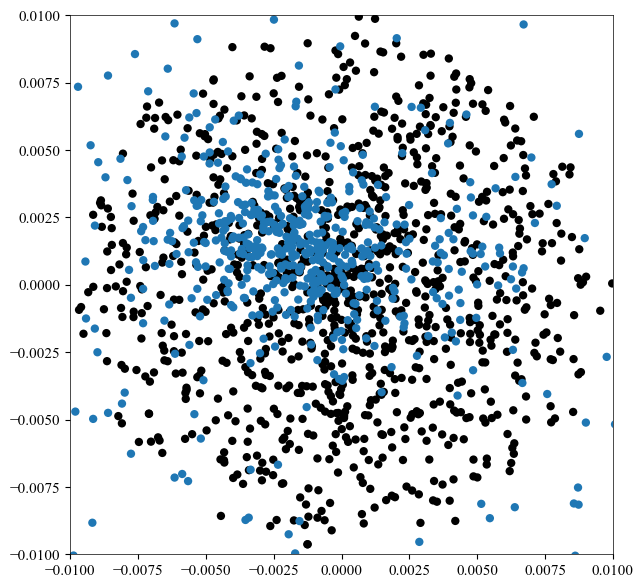

In [201]:
i = -1
plt.figure(figsize=(7,7))
plt.scatter(sim.positions[0, :,0], sim.positions[0, :,1])
plt.scatter(sim.positions[i, :,0], sim.positions[i, :,1])
plt.xlim(-0.01, 0.01)
plt.ylim(-0.01, 0.01)

In [202]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(7, 7))

def update(frame):
    ax.clear()
    #ax.scatter(sim.positions[0, :, 0], sim.positions[0, :, 1], alpha=0.5, label='Initial')
    ax.scatter(sim.positions[frame*10, :, 0], sim.positions[frame*10, :, 1], alpha=0.75, label=f'Frame {frame*10}')
    ax.set_xlim(-0.01, 0.01)
    ax.set_ylim(-0.01, 0.01)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'Particle Positions - Timestep {frame}/{len(sim.positions)-1}')

anim = FuncAnimation(fig, update, frames=len(sim.positions)//10, interval=100, repeat=True)
plt.close()
HTML(anim.to_jshtml())

In [ ]:
hydrosim = gh.Simulation()
hydrosim.run(pos, vel, masses, ts, gravityMethod='directSummation', use_numba=True, gravityOnly=False, hydroOnly=False, unitLength=1 * u.pc, cs = )

  0%|          | 0/799 [00:00<?, ?it/s]


TypeError: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(7, 7))

def update(frame):
    ax.clear()
    #ax.scatter(sim.positions[0, :, 0], sim.positions[0, :, 1], alpha=0.5, label='Initial')
    ax.scatter(sim.positions[frame*10, :, 0], sim.positions[frame*10, :, 1], alpha=0.75, label=f'Frame {frame*10}')
    ax.set_xlim(-0.01, 0.01)
    ax.set_ylim(-0.01, 0.01)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'Particle Positions - Timestep {frame}/{len(sim.positions)-1}')

anim = FuncAnimation(fig, update, frames=len(sim.positions)//10, interval=100, repeat=True)
plt.close()
HTML(anim.to_jshtml())

In [172]:
dens = gh.densities(gh.convert_to_internal(sim.positions[0], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))

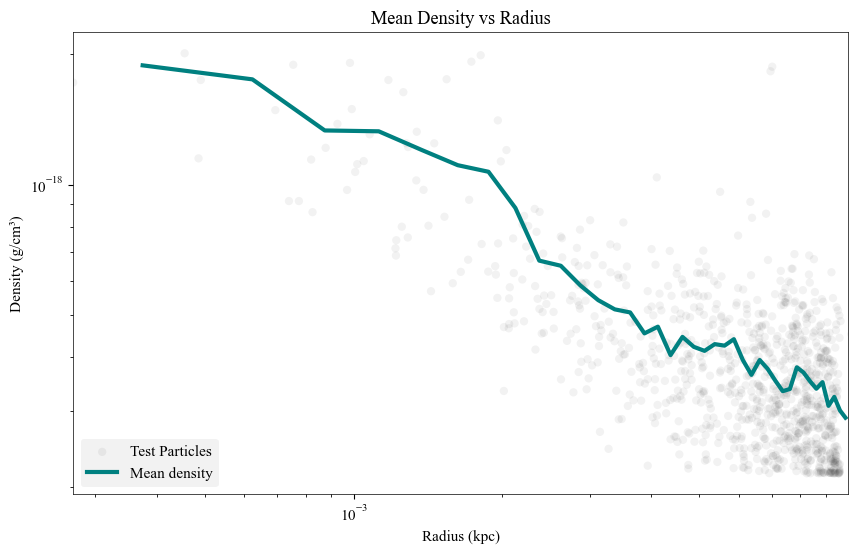

In [173]:
# find mean density in radius bins:
i = 0
n_bins = 40
Rmax = np.max(Rs[0])
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
dens = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
dens = gh.convert_to_physical(dens, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
# Assign each particle to a bin
bin_indices = np.digitize(Rs[i].value, bin_edges)

# Calculate mean density in each bin
mean_dens_bins = []
for i in range(1, n_bins + 1):
    mask = bin_indices == i
    if np.sum(mask) > 0:
        mean_dens_bins.append(np.mean(dens[mask]).value)
    else:
        mean_dens_bins.append(np.nan)

mean_dens_bins = np.array(mean_dens_bins)

# Plot


plt.figure(figsize=(10, 6))
plt.scatter(Rs[i], dens, alpha=0.05, label='Test Particles')
plt.plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
plt.xlim(min(Rs[i]).value,Rmax.to(u.kpc).value)
plt.xlabel('Radius (kpc)')
plt.ylabel('Density (g/cm³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Mean Density vs Radius')
plt.show()

In [ ]:
# max_dens = 0
# min_dens = 1
# for i in range(0, len(sim.positions)):
    
#     dens_i = gh.densities(
#             gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
#             masses, 
#             h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
#         )
#     if np.min(dens_i) < min_dens:
#         min_dens = np.min(dens_i)

#     if np.max(dens_i) > max_dens:
#         max_dens = np.max(dens_i)

In [ ]:
# min_dens = gh.convert_to_physical(min_dens, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
# max_dens = gh.convert_to_physical(max_dens, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)

In [ ]:
# min_dens, max_dens

(<Quantity 2.15429117e-19 g / cm3>, <Quantity 3.16260507e-17 g / cm3>)

In [ ]:
# from matplotlib.animation import FuncAnimation
# from IPython.display import HTML

# fig, ax = plt.subplots(figsize=(10, 6))

# def update(i):
#     ax.clear()
#     i = i * 5
#     # Calculate density for this timestep
#     dens_i = gh.densities(
#         gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
#         masses, 
#         h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     )
#     dens_i = gh.convert_to_physical(dens_i, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    
#     # Calculate bins for this timestep
#     Rmax_i = np.max(Rs[0])
#     Rmin_i  = min(Rs[i])
#     bin_edges_i = np.linspace(Rmin_i.value, Rmax_i.value, n_bins + 1)
#     bin_centers_i = (bin_edges_i[:-1] + bin_edges_i[1:]) / 2
#     bin_indices_i = np.digitize(Rs[i].value, bin_edges_i)
    
#     # print(Rmin_i, bin_edges_i[0])
    
#     # Calculate mean density in each bin
#     mean_dens_bins_i = []
#     for j in range(1, n_bins + 1):
#         mask = bin_indices_i == j
#         if np.sum(mask) > 0:
#             #print(np.mean(dens_i[mask]).value)
#             mean_dens_bins_i.append(np.mean(dens_i[mask]).value)
#         else:
#             mean_dens_bins_i.append(np.nan)
#     mean_dens_bins_i = np.array(mean_dens_bins_i)
    
#     # Plot
#     ax.scatter(Rs[i], dens_i, alpha=0.05, label='Test Particles')
#     ax.plot(bin_centers_i, mean_dens_bins_i, lw=3, alpha=1, label='Mean density', c='teal')
#     ax.set_xlabel('Radius (kpc)')
#     ax.set_ylabel('Density (g/cm³)')
#     ax.set_yscale('log')
#     ax.set_xscale('log')
#     ax.legend()
#     ax.set_ylim(min_dens.value, max_dens.value)
#     ax.set_xlim(np.min(Rs).value, Rmax_i.value)
#     ax.set_title(f'Mean Density vs Radius - Timestep {i}/{len(sim.positions)-1}')
    
# anim = FuncAnimation(fig, update, frames=len(sim.positions)//5, interval=100, repeat=True)
# plt.close()
# HTML(anim.to_jshtml())

IndexError: index 400 is out of bounds for axis 0 with size 400

In [83]:
np.log10(Rmax.value)

np.float64(-2.000268305293249)

In [85]:
Rmax.to(u.pc)

<Quantity 9.99382395 pc>

In [ ]:
# import plotly.graph_objects as go

# # Calculate global min/max for axis limits
# all_dens = []
# all_Rs = []
# plot_every = 5
# for i_ in range(len(sim.positions)//plot_every):
#     i = i_ * plot_every
#     dens_i = gh.densities(
#         gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
#         masses, 
#         h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     )
#     dens_i = gh.convert_to_physical(dens_i, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     all_dens.append(dens_i.value)
#     all_Rs.append(Rs[i].value)

# # Get global limits
# r_min, r_max = np.min(all_Rs)*0.001, np.max(all_Rs)
# dens_min, dens_max = np.min(all_dens), np.max(all_dens)

# # Prepare frames
# frames = []
# for i in range(len(sim.positions)):
#     dens_i = gh.densities(
#         gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
#         masses, 
#         h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     )
#     dens_i = gh.convert_to_physical(dens_i, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    
#     Rmax_i = np.max(Rs[i])
#     bin_edges_i = np.linspace(0, Rmax_i.value, n_bins + 1)
#     bin_centers_i = (bin_edges_i[:-1] + bin_edges_i[1:]) / 2
#     bin_indices_i = np.digitize(Rs[i].value, bin_edges_i)
    
#     mean_dens_bins_i = []
#     for j in range(1, n_bins + 1):
#         mask = bin_indices_i == j
#         if np.sum(mask) > 0:
#             mean_dens_bins_i.append(np.mean(dens_i[mask]).value)
#         else:
#             mean_dens_bins_i.append(np.nan)
#     mean_dens_bins_i = np.array(mean_dens_bins_i)
    
#     frames.append(go.Frame(
#         data=[
#             go.Scatter(x=Rs[i].value, y=dens_i.value, mode='markers', 
#                       marker=dict(size=3, opacity=0.05), name='Test Particles'),
#             go.Scatter(x=bin_centers_i, y=mean_dens_bins_i, mode='lines', 
#                       line=dict(width=3, color='teal'), name='Mean density')
#         ],
#         name=str(i)
#     ))

# # Create initial plot
# fig = go.Figure(
#     data=frames[0].data,
#     frames=frames
# )

# # Add slider and play button with fixed axis ranges
# fig.update_layout(
#     title='Mean Density vs Radius - Time Evolution',
#     xaxis=dict(title='Radius (pc)', type='log', range=[np.log10(r_min), np.log10(r_max)]),
#     yaxis=dict(title='Density (g/cm³)', type='log', range=[np.log10(dens_min), np.log10(dens_max)]),
#     updatemenus=[{
#         'type': 'buttons',
#         'showactive': False,
#         'buttons': [
#             {'label': 'Play', 'method': 'animate', 'args': [None, {'frame': {'duration': 100, 'redraw': True}}]},
#             {'label': 'Pause', 'method': 'animate', 'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate'}]}
#         ]
#     }],
#     sliders=[{
#         'steps': [{'args': [[f.name], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate'}],
#                   'label': f'i={f.name}', 'method': 'animate'} for f in frames],
#         'active': 0,
#         'yanchor': 'top',
#         'xanchor': 'left'
#     }]
# )

# fig.show()

# Isothermal Collapse

In [178]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u

## Particles initialized with density ~ 1/r

Use inverse transform sampling.

Probability of find a particle in an infinitesimal volume element $dV = 4 \pi r^2 dr$ is $P(r) dV$.

$ r = R_{\text{max}} \sqrt{U}$, where $U$ are uniformly distributed random numbers.




In [180]:
n_pts = int(1e4)
U = np.random.uniform(0, 1, n_pts)

Rmax = (5e16 * u.cm).to(u.pc) # units pc
Rs = Rmax * np.sqrt(U)
phis = 2 * np.pi * np.random.uniform(0, 1, n_pts)
thetas = np.arccos(2 * np.random.rand(n_pts) - 1)

xs = Rs * np.sin(thetas) * np.cos(phis)
ys = Rs * np.sin(thetas) * np.sin(phis)
zs = Rs * np.cos(thetas)

In [181]:
pos = np.array([xs, ys, zs]).T * u.pc

In [182]:
import plotly.graph_objects as go

# fig = go.Figure(data=[go.Scatter3d(
#     x=xs.value,
#     y=ys.value,
#     z=zs.value,
#     mode='markers',
#     marker=dict(
#         size=2,
#         color=Rs.value,
#         colorscale='Viridis',
#         showscale=True,
#         colorbar=dict(title='R (pc)')
#     )
# )])

# fig.update_layout(
#     title='3D Distribution of Particles',
#     scene=dict(
#         xaxis_title='x (pc)',
#         yaxis_title='y (pc)',
#         zaxis_title='z (pc)'
#     ),
#     width=800,
#     height=800
# )

# fig.show()

In [183]:
rho0 = 3.82e-18 *u.g * u.cm**3
cs = 1.66e4 * u.cm / u.s

In [184]:
from scipy.spatial import KDTree

# Build KDTree for efficient nearest neighbor search
tree = KDTree(pos.value)

# Query for the 2 nearest neighbors (includes the particle itself)
# k=2 because the closest neighbor is the particle itself
distances, indices = tree.query(pos.value, k=2)

# The second column contains distances to the nearest neighbor (excluding itself)
nearest_neighbor_distances = distances[:, 1] * u.pc

# Calculate average nearest neighbor distance
avg_nearest_neighbor_distance = np.mean(nearest_neighbor_distances)

print(f"Average nearest neighbor distance: {avg_nearest_neighbor_distance:.4f}")


Average nearest neighbor distance: 0.0007 pc


In [185]:
# Confirm that denities follow 1/r power law.
cloud_mass = 1 * u.Msun
cloud_volume = (4/3) * np.pi * Rmax**3
particle_mass = cloud_mass / n_pts
masses = np.ones(n_pts) * particle_mass

from gravhydro import densities, convert_to_internal, convert_to_physical
h = 2 * avg_nearest_neighbor_distance
dens = densities(convert_to_internal(pos), convert_to_internal(masses), convert_to_internal(h))
dens = convert_to_physical(dens, 'mass density', True)

TypeError: convert_to_internal() missing 3 required positional arguments: 'unitLength', 'unitTime', and 'unitMass'

In [186]:
# find mean density in radius bins:

n_bins = 40
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Assign each particle to a bin
bin_indices = np.digitize(Rs.value, bin_edges)

# Calculate mean density in each bin
mean_dens_bins = []
for i in range(1, n_bins + 1):
    mask = bin_indices == i
    if np.sum(mask) > 0:
        mean_dens_bins.append(np.mean(dens[mask]).value)
    else:
        mean_dens_bins.append(np.nan)

mean_dens_bins = np.array(mean_dens_bins)

# Plot


plt.figure(figsize=(10, 6))
plt.scatter(Rs, dens, alpha=0.05, label='Test Particles')
plt.plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
plt.xlabel('Radius (pc)')
plt.ylabel('Density (g/cm³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Mean Density vs Radius')
plt.show()

IndexError: boolean index did not match indexed array along axis 0; size of axis is 1000 but size of corresponding boolean axis is 10000

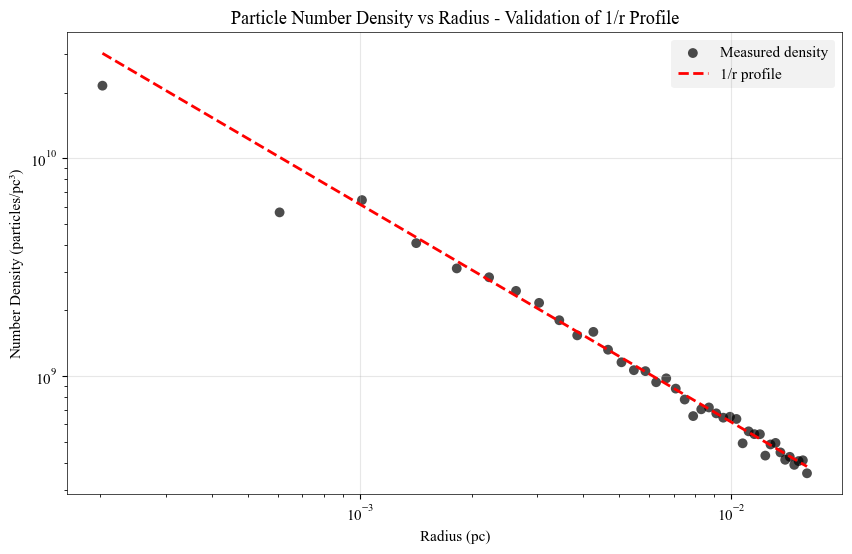

In [187]:
# Validate 1/r density profile by counting particles in radial bins
n_bins = 40
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
bin_widths = bin_edges[1:] - bin_edges[:-1]

# Count particles in each bin
counts, _ = np.histogram(Rs.value, bins=bin_edges)

# Calculate shell volumes
shell_volumes = (4/3) * np.pi * (bin_edges[1:]**3 - bin_edges[:-1]**3)

# Number density (particles per unit volume)
number_density = counts / shell_volumes

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(bin_centers, number_density, s=50, alpha=0.7, label='Measured density')
plt.plot(bin_centers, 1/bin_centers * np.median(number_density * bin_centers), 
         'r--', linewidth=2, label='1/r profile')
plt.xlabel('Radius (pc)')
plt.ylabel('Number Density (particles/pc³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Particle Number Density vs Radius - Validation of 1/r Profile')
plt.grid(True, alpha=0.3)
plt.show()


## Add solid body rotation

In [188]:
omega = 7.2e-13 * u.rad / u.s